In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
df = pd.read_csv("data_clean.csv", index_col=0)

In [3]:
df.describe()

,Ozone,Solar.R,Wind,Day,Year,Temp
count,120.000000,151.000000,158.000000,158.000000,158.0,158.000000
mean,41.583333,185.403974,9.957595,16.006329,2010.0,77.727848
std,32.620709,88.723103,3.511261,8.997166,0.0,9.377877
min,1.000000,7.000000,1.700000,1.000000,2010.0,56.000000
25%,18.000000,119.000000,7.400000,8.000000,2010.0,72.000000
50%,30.500000,197.000000,9.700000,16.000000,2010.0,78.500000
75%,61.500000,257.000000,11.875000,24.000000,2010.0,84.000000
max,168.000000,334.000000,20.700000,31.000000,2010.0,97.000000


In [4]:
df.describe(include = object)

,Temp C,Month,Weather
count,158,158,155
unique,41,6,3
top,81,9,S
freq,11,34,59


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158 entries, 1 to 158
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Ozone    120 non-null    float64
 1   Solar.R  151 non-null    float64
 2   Wind     158 non-null    float64
 3   Temp C   158 non-null    object 
 4   Month    158 non-null    object 
 5   Day      158 non-null    int64  
 6   Year     158 non-null    int64  
 7   Temp     158 non-null    int64  
 8   Weather  155 non-null    object 
dtypes: float64(3), int64(3), object(3)
memory usage: 12.3+ KB


# Data Type Conversion

In [6]:
df['Temp C'].unique()

array(['67', '72', '74', '62', '56', '66', '65', '59', '61', '69', 'C',
       '68', '58', '64', '57', '73', '81', '79', '76', '78', '84', '85',
       '82', '87', '90', '93', '92', '80', '77', '75', '83', '88', '89',
       '91', '86', '97', '94', '96', '71', '63', '70'], dtype=object)

In [7]:
df['Temp C'].replace('C',np.nan,inplace=True)

In [8]:
df['Temp C'].unique()

array(['67', '72', '74', '62', '56', '66', '65', '59', '61', '69', nan,
       '68', '58', '64', '57', '73', '81', '79', '76', '78', '84', '85',
       '82', '87', '90', '93', '92', '80', '77', '75', '83', '88', '89',
       '91', '86', '97', '94', '96', '71', '63', '70'], dtype=object)

In [9]:
df['Month'].unique()

array(['5', 'May', '6', '7', '8', '9'], dtype=object)

In [10]:
df['Month'].replace('May','5', inplace=True)

In [11]:
df['Month'].unique()

array(['5', '6', '7', '8', '9'], dtype=object)

In [12]:
# Replacee Method

In [13]:
df['Month'] = df['Month'].astype(int)

In [14]:
df['Month'].dtype

dtype('int32')

In [15]:
df['Temp C'].dtype

dtype('O')

In [16]:
df['Temp C'] = pd.to_numeric(df['Temp C'], errors='coerce')

In [17]:
df.info

<bound method DataFrame.info of      Ozone  Solar.R  Wind  Temp C  Month  Day  Year  Temp Weather
1     41.0    190.0   7.4    67.0      5    1  2010    67       S
2     36.0    118.0   8.0    72.0      5    2  2010    72       C
3     12.0    149.0  12.6    74.0      5    3  2010    74      PS
4     18.0    313.0  11.5    62.0      5    4  2010    62       S
5      NaN      NaN  14.3    56.0      5    5  2010    56       S
..     ...      ...   ...     ...    ...  ...   ...   ...     ...
154   41.0    190.0   7.4    67.0      5    1  2010    67       C
155   30.0    193.0   6.9    70.0      9   26  2010    70      PS
156    NaN    145.0  13.2    77.0      9   27  2010    77       S
157   14.0    191.0  14.3    75.0      9   28  2010    75       S
158   18.0    131.0   8.0    76.0      9   29  2010    76       C

[158 rows x 9 columns]>

# Duplicate

In [18]:
df[df.duplicated()]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [19]:
df[df.duplicated(keep=False)]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
151,14.0,191.0,14.3,75.0,9,28,2010,75,S
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [20]:
df[(df['Ozone'] == 14.0) & (df ['Day'] == 28)]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
151,14.0,191.0,14.3,75.0,9,28,2010,75,S
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [21]:
df.drop_duplicates(inplace=True)

In [22]:
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S


# Rename the Columns

In [23]:
df.rename(columns={'Solar.R' : 'Solar'},inplace= True)

In [24]:
df.head()

,Ozone,Solar,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S


# Missing values imputation


In [25]:
# Check the null

In [26]:
df.isna().sum()

Ozone      38
Solar       7
Wind        0
Temp C      1
Month       0
Day         0
Year        0
Temp        0
Weather     3
dtype: int64

In [27]:
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

sns.set_style('darkgrid')

<AxesSubplot:>

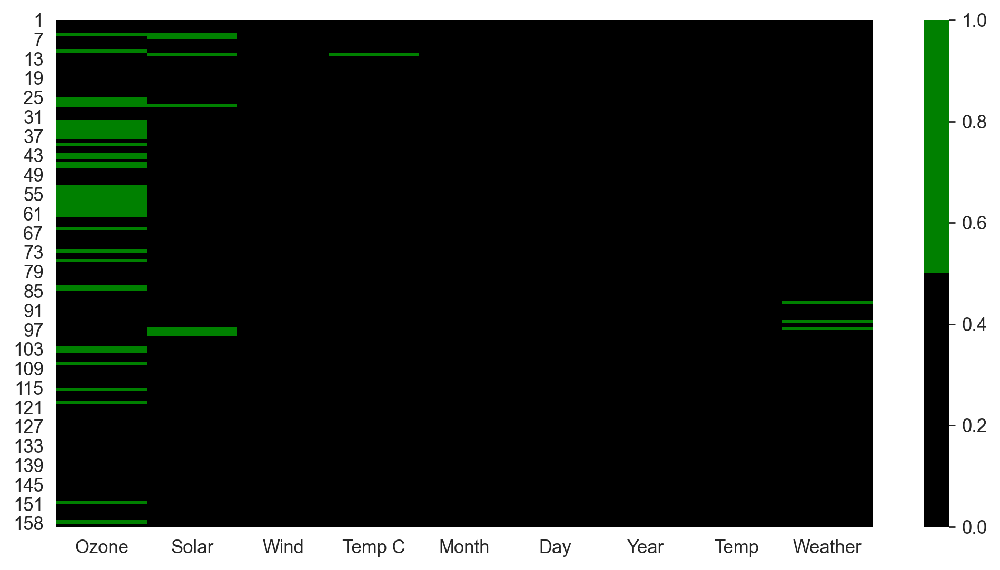

In [28]:
sns.heatmap(df.isna(), cmap=['black','green'])

# Rules for missing value imputation :

1.

In [29]:
# calculate the percentage of missing values in each column

In [30]:
null_val = df.isna().sum()/len(df)*100

In [31]:
null_val = (df.isna() ,camp=['black','green'])

SyntaxError: invalid syntax (902451304.py, line 1)

In [32]:
null_val

Ozone      24.203822
Solar       4.458599
Wind        0.000000
Temp C      0.636943
Month       0.000000
Day         0.000000
Year        0.000000
Temp        0.000000
Weather     1.910828
dtype: float64

In [33]:
median = df['Ozone'].median()
df['Ozone'].fillna(median,inplace=True)

In [34]:
df['Solar'].fillna(df['Solar'].median(),inplace=True)

In [35]:
df['Weather'].mode()

0    S
Name: Weather, dtype: object

In [36]:
df['Weather'].fillna(df['Weather'].mode()[0],inplace=True)

In [37]:
df.isna().sum()

Ozone      0
Solar      0
Wind       0
Temp C     1
Month      0
Day        0
Year       0
Temp       0
Weather    0
dtype: int64

# OutLier Detection

In [38]:
plt.rcParams['figure.figsize']=(10,5)
plt.rcParams['figure.dpi'] = 250

sns.set_style('darkgrid')

(array([28., 74., 21.,  9., 11.,  7.,  3.,  2.,  1.,  1.]),
 array([  1. ,  17.7,  34.4,  51.1,  67.8,  84.5, 101.2, 117.9, 134.6,
        151.3, 168. ]),
 <BarContainer object of 10 artists>)

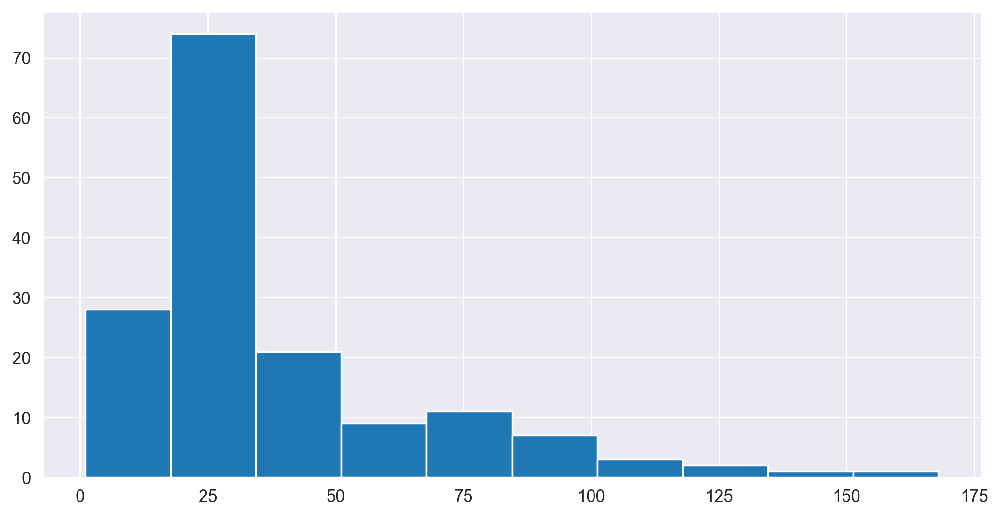

In [39]:
plt.hist(df['Ozone'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1eae87c00d0>,
 'caps': [<matplotlib.lines.Line2D at 0x1eae87c0670>,
 'boxes': [<matplotlib.patches.PathPatch at 0x1eae87adcd0>],
 'medians': [<matplotlib.lines.Line2D at 0x1eae87c0c10>],
 'fliers': [<matplotlib.lines.Line2D at 0x1eae87cd1f0>],
 'means': [<matplotlib.lines.Line2D at 0x1eae87c0ee0>]}

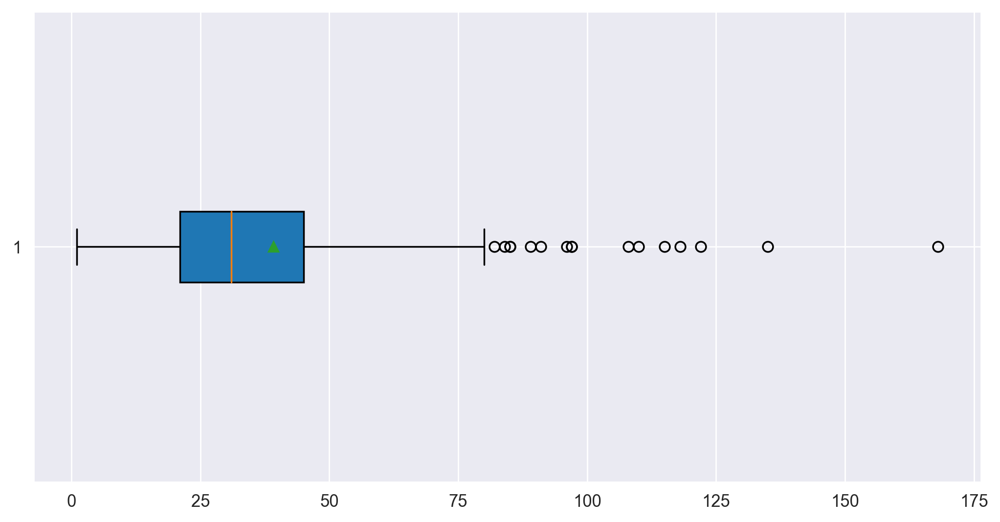

In [40]:
plt.boxplot(df['Ozone'],vert=False, patch_artist=True, showmeans=True)

In [41]:
df[df['Ozone']>77]

,Ozone,Solar,Wind,Temp C,Month,Day,Year,Temp,Weather
30,115.0,223.0,5.7,79.0,5,30,2010,79,C
62,135.0,269.0,4.1,84.0,7,1,2010,84,S
69,97.0,267.0,6.3,92.0,7,8,2010,92,PS
70,97.0,272.0,5.7,92.0,7,9,2010,92,C
71,85.0,175.0,7.4,89.0,7,10,2010,89,PS
80,79.0,187.0,5.1,87.0,7,19,2010,87,PS
85,80.0,294.0,8.6,86.0,7,24,2010,86,PS
86,108.0,223.0,8.0,85.0,7,25,2010,85,PS
89,82.0,213.0,7.4,88.0,7,28,2010,88,S
96,78.0,199.0,6.9,86.0,8,4,2010,86,S


{'whiskers': [<matplotlib.lines.Line2D at 0x1eae8822cd0>,
 'caps': [<matplotlib.lines.Line2D at 0x1eae88342b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1eae8822a00>,
 'medians': [<matplotlib.lines.Line2D at 0x1eae8834850>,
 'fliers': [<matplotlib.lines.Line2D at 0x1eae8834ac0>,
 'means': []}

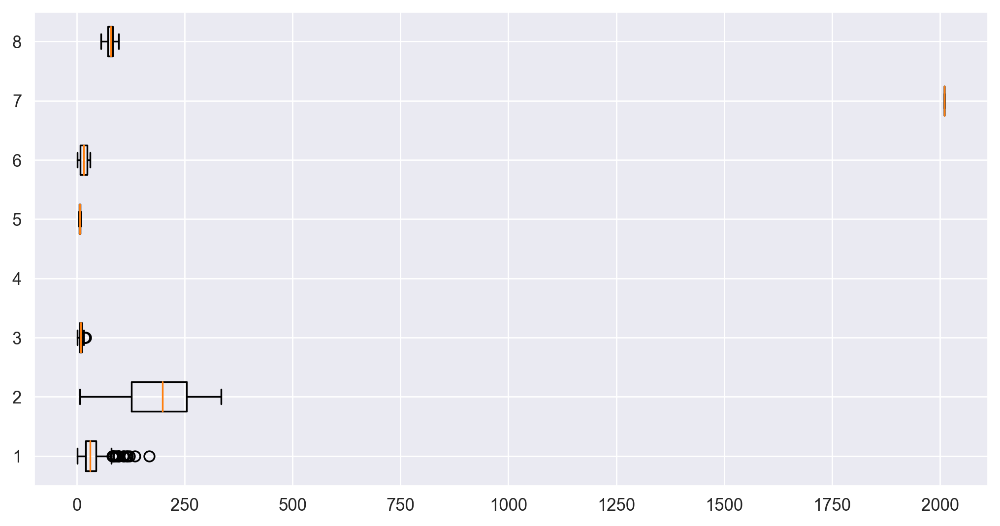

In [42]:
plt.boxplot(df.drop(columns=['Weather']), vert=False)

# Scatter Plot and Correlation

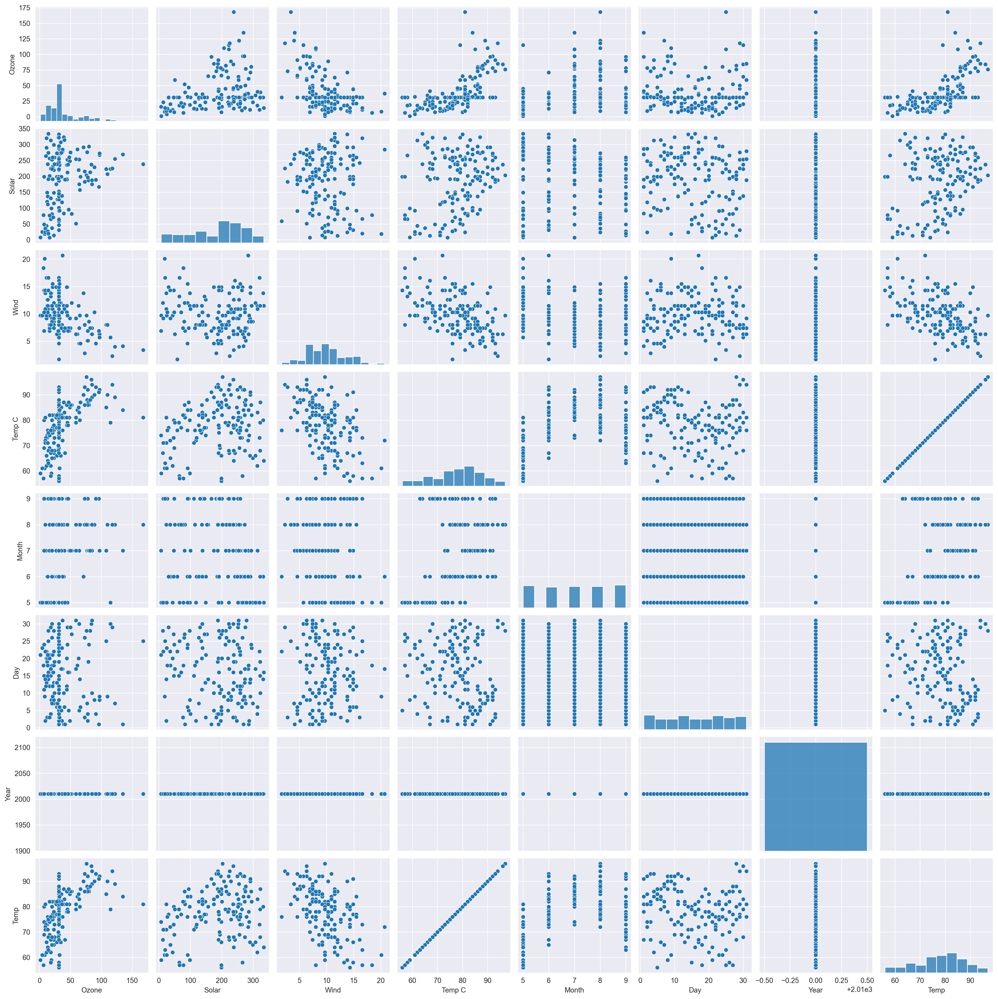

In [43]:
sns.pairplot(df)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:100: UserWarning: Attempting to set identical left == right == 2010.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:101: UserWarning: Attempting to set identical bottom == top == 2010.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:91: UserWarning: Attempting to set identical left == right == 2010.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


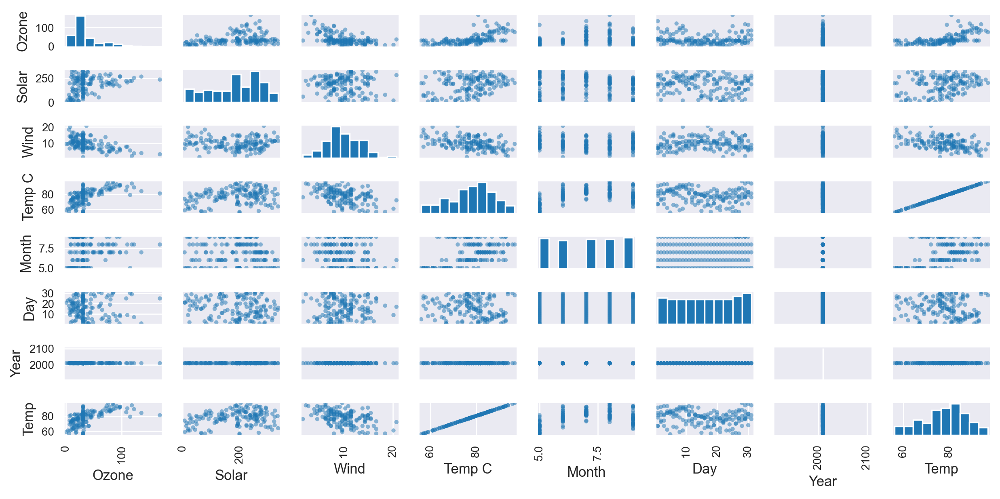

In [44]:
pd.plotting.scatter_matrix(df)
plt.tight_layout()         # over lapping values

In [45]:
df.corr()

,Ozone,Solar,Wind,Temp C,Month,Day,Year,Temp
Ozone,1.000000,0.297561,-0.523738,0.596932,0.171488,-0.031737,NaN,0.597087
Solar,0.297561,1.000000,-0.057709,0.257529,-0.083788,-0.156243,NaN,0.256994
Wind,-0.523738,-0.057709,1.000000,-0.444749,-0.170328,0.029900,NaN,-0.441228
Temp C,0.596932,0.257529,-0.444749,1.000000,0.407262,-0.124383,NaN,1.000000
Month,0.171488,-0.083788,-0.170328,0.407262,1.000000,0.041438,NaN,0.408060
Day,-0.031737,-0.156243,0.029900,-0.124383,0.041438,1.000000,NaN,-0.122787
Year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temp,0.597087,0.256994,-0.441228,1.000000,0.408060,-0.122787,NaN,1.000000


<AxesSubplot:>

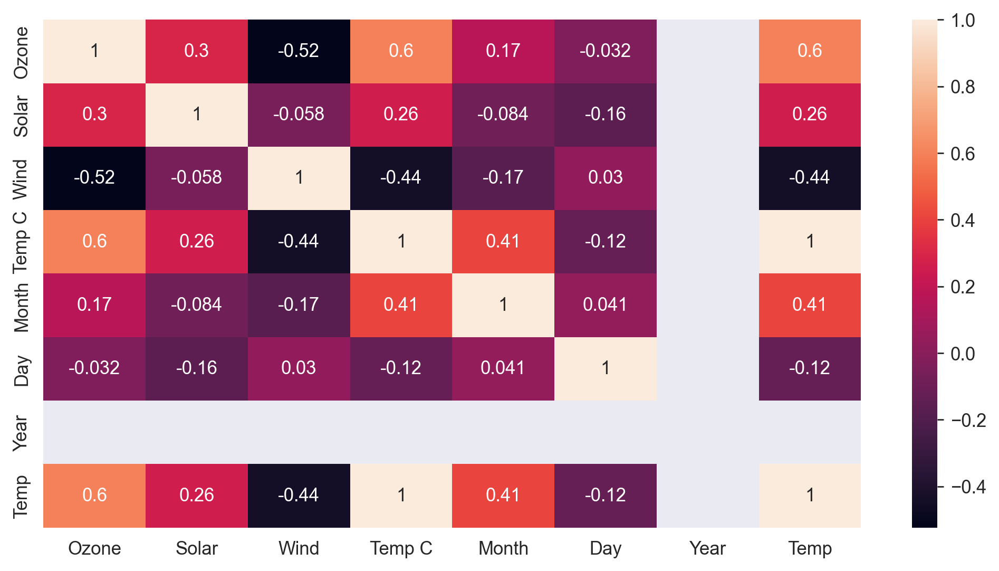

In [46]:
sns.heatmap(df.corr(),annot=True)  # annot for values on heatmap

# Transformations

In [47]:
#Machines do not understand words and sentences
#machines only understand numbers
#before model building we convert all the categorical into numerical

In [48]:
df = pd.get_dummies(data=df , columns=['Weather'])

In [49]:
df

,Ozone,Solar,Wind,Temp C,Month,Day,Year,Temp,Weather_C,Weather_PS,Weather_S
1,41.0,190.0,7.4,67.0,5,1,2010,67,0,0,1
2,36.0,118.0,8.0,72.0,5,2,2010,72,1,0,0
3,12.0,149.0,12.6,74.0,5,3,2010,74,0,1,0
4,18.0,313.0,11.5,62.0,5,4,2010,62,0,0,1
5,31.0,199.0,14.3,56.0,5,5,2010,56,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,68.0,9,30,2010,68,0,0,1
154,41.0,190.0,7.4,67.0,5,1,2010,67,1,0,0
155,30.0,193.0,6.9,70.0,9,26,2010,70,0,1,0
156,31.0,145.0,13.2,77.0,9,27,2010,77,0,0,1


In [50]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [51]:
# Normalization

mn = MinMaxScaler()

In [52]:
df1 = mn.fit_transform(df)
df1 = pd.DataFrame(df1, columns=df.columns)

In [53]:
df1['Ozone'].max()

1.0000000000000002

In [54]:
#Standardization

In [55]:
sc = StandardScaler()

In [56]:
df2 = pd.DataFrame(sc.fit_transform(df), columns=df.columns)

df2

,Ozone,Solar,Wind,Temp C,Month,Day,Year,Temp,Weather_C,Weather_PS,Weather_S
0,0.062828,0.046394,-0.724079,-1.145599,-1.412198,-1.668937,0.0,-1.146116,-0.673575,-0.653661,1.25450
1,-0.111448,-0.783413,-0.552356,-0.613714,-1.412198,-1.557152,0.0,-0.612802,1.484615,-0.653661,-0.79713
2,-0.947971,-0.426135,0.764184,-0.400960,-1.412198,-1.445367,0.0,-0.399476,-0.673575,1.529845,-0.79713
3,-0.738840,1.463982,0.449359,-1.677485,-1.412198,-1.333583,0.0,-1.679431,-0.673575,-0.653661,1.25450
4,-0.285723,0.150120,1.250731,-2.315747,-1.412198,-1.221798,0.0,-2.319408,-0.673575,-0.653661,1.25450
...,...,...,...,...,...,...,...,...,...,...,...
152,-0.669130,0.426722,0.449359,-1.039222,1.385469,1.572816,0.0,-1.039454,-0.673575,-0.653661,1.25450
153,0.062828,0.046394,-0.724079,-1.145599,-1.412198,-1.668937,0.0,-1.146116,1.484615,-0.653661,-0.79713
154,-0.320578,0.080969,-0.867181,-0.826468,1.385469,1.125678,0.0,-0.826128,-0.673575,1.529845,-0.79713
155,-0.285723,-0.472236,0.935906,-0.081829,1.385469,1.237462,0.0,-0.079488,-0.673575,-0.653661,1.25450


In [57]:
df2['Ozone'].mean()

-1.4142968466562504e-17

In [58]:
df2['Ozone'].std()

1.0032000081789556

# Speed up the EDA process

In [59]:
!pip install pandas-profiling==3.1.0
!pip install Sweetviz

  Using cached joblib-1.0.1-py3-none-any.whl (303 kB)
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\ProgramData\\Anaconda3\\Lib\\site-packages\\~arkupsafe\\_speedups.cp39-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [60]:
import pandas_profiling as pp
import sweetviz as sv 

In [61]:
df.head()

,Ozone,Solar,Wind,Temp C,Month,Day,Year,Temp,Weather_C,Weather_PS,Weather_S
1,41.0,190.0,7.4,67.0,5,1,2010,67,0,0,1
2,36.0,118.0,8.0,72.0,5,2,2010,72,1,0,0
3,12.0,149.0,12.6,74.0,5,3,2010,74,0,1,0
4,18.0,313.0,11.5,62.0,5,4,2010,62,0,0,1
5,31.0,199.0,14.3,56.0,5,5,2010,56,0,0,1


In [62]:
EDA_report=pp.ProfileReport(df, title="Pandas Profiling Report", vars={"num" : {"low_categorical_threshold":0}})
EDA_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [63]:
EDA_report.to_file(output_file='EDA.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [64]:
sweet_report = sv.analyze(df)

                                             |                                             | [  0%]   00:00 ->…

In [65]:
sweet_report

In [66]:
sweet_report.show_html('weather_report.html')

Report weather_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
